## Importing the Neccessary Libraries

In [1]:
import os, glob, random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
from string import ascii_lowercase

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, average_precision_score, precision_recall_curve

import torch, transformers
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSeq2SeqLM,
    DataCollatorForSeq2Seq,
    Trainer,
    TrainingArguments,
)

## Loading the data directory

In [2]:
DATA_DIR = "/kaggle/input/mentalhealthdata" 
PATTERN  = "*.csv"       # file pattern
LOWERCASE_LABELS = True  

## Mapping Classes - One Class for each file

In [3]:
files = sorted(glob.glob(os.path.join(DATA_DIR, PATTERN)))
if len(files) == 0:
    raise FileNotFoundError(f"No CSV files found in {DATA_DIR} with pattern {PATTERN}")

# Raw labels from filenames: first token before first underscore; whole stem if no underscore
raw_labels = []
for p in files:
    base = os.path.basename(p)
    stem = os.path.splitext(base)[0]
    token = stem.split("_", 1)[0] if "_" in stem else stem
    token = token.strip()
    if LOWERCASE_LABELS:
        token = token.lower()
    raw_labels.append(token)

# Ensure labels are unique: if duplicates, append _2, _3, ...
labels = []
seen = {}
for lab in raw_labels:
    if lab not in seen:
        seen[lab] = 1
        labels.append(lab)
    else:
        seen[lab] += 1
        labels.append(f"{lab}_{seen[lab]}")

# Show the mapping
mapping_df = pd.DataFrame({
    "file": [os.path.basename(p) for p in files],
    "class_label": labels
})
print("=== File → Class mapping ===")
display(mapping_df)
print(f"Files found: {len(files)} | Classes derived: {len(labels)}")


=== File → Class mapping ===


,file,class_label
0,ADHD_with_comments.csv,adhd
1,BPD_with_comments.csv,bpd
2,Bipolar_with_comments.csv,bipolar
3,OCD_with_comments.csv,ocd
4,PanicAttack_with_comments.csv,panicattack
5,SocialAnxiety_with_comments.csv,socialanxiety
6,SuicideWatch_with_comments.csv,suicidewatch
7,anxiety_with_comments.csv,anxiety
8,depression_with_comments.csv,depression
9,mentalhealth_with_comments.csv,mentalhealth


Files found: 12 | Classes derived: 12


## Creating the Dataframe

In [4]:
dfs = []
for p, lab in zip(files, labels):
    df = pd.read_csv(p)
    df.insert(0, "category", lab)  # put the class column first
    dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)

print("=== Combined DataFrame preview ===")
display(combined_df.head())
print("Shape:", combined_df.shape)

n_classes = combined_df["category"].nunique()
print(f"Unique classes in combined_df: {n_classes} (expected {len(files)})")
if n_classes != len(files):
    print("Note: If this is not equal, check for duplicate first tokens in filenames or adjust LOWERCASE_LABELS.")


=== Combined DataFrame preview ===


,category,Title,Author,Upvotes,Text,Created_At,URL,Top_10_Comments
0,adhd,My son's ADHD saved his sister's life,NaN,15204,My son was only 7 years old when he took a pic...,2024-12-16 02:05:27,https://www.reddit.com/r/ADHD/comments/1hf8k5t...,Hi /u/Ollie-Branch and thanks for posting on /...
1,adhd,Reminder: If you made it to adulthood with lat...,Hipster-Deuxbag,7577,"We all know the statistics: 20,000 behavioral ...",2024-08-25 00:48:44,https://www.reddit.com/r/ADHD/comments/1f0k9en...,Hi /u/Hipster-Deuxbag and thanks for posting o...
2,adhd,Children with higher IQ scores were diagnosed ...,Pretend_Voice_3140,4574,A study was published in the [British Journal ...,2024-11-05 12:24:31,https://www.reddit.com/r/ADHD/comments/1gk5ftv...,Hi /u/Pretend_Voice_3140 and thanks for postin...
3,adhd,LIFE HACK I JUST DISCOVERED,expert_in_wumbo,4378,I feel like I just cracked the Zodiac cipher o...,2024-05-29 02:26:19,https://www.reddit.com/r/ADHD/comments/1d31ih7...,Hi /u/expert_in_wumbo and thanks for posting o...
4,adhd,no meds 10 months. i'm barely recognizable,NaN,3814,"10 months ago I ran into a NP that ""doesn't pe...",2024-07-09 14:10:26,https://www.reddit.com/r/ADHD/comments/1dz3dq0...,Hi /u/rainjoyed and thanks for posting on /r/A...


Shape: (10439, 8)
Unique classes in combined_df: 12 (expected 12)


## Counting Values Per Class

=== Class counts ===


,category,count
0,adhd,963
2,anxiety,943
5,bipolar,911
7,bpd,875
8,depression,847
11,mentalhealth,714
4,mentalillness,914
9,ocd,778
1,panicattack,955
6,ptsd,878


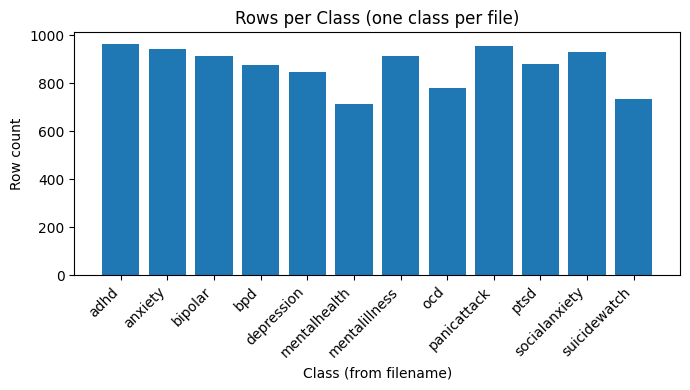

In [5]:
class_counts = (
    combined_df["category"]
    .value_counts()
    .rename_axis("category")
    .reset_index(name="count")
    .sort_values("category")
)

print("=== Class counts ===")
display(class_counts)

plt.figure(figsize=(7,4))
plt.bar(class_counts["category"], class_counts["count"])
plt.title("Rows per Class (one class per file)")
plt.xlabel("Class (from filename)"); plt.ylabel("Row count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


## Generating Wordclouds

In [6]:
df_wc = combined_df[["category", "Title", "Text", "Top_10_Comments"]].copy()

df_wc["comments_str"] = df_wc["Top_10_Comments"].apply(
    lambda v: " ".join(map(str, v)) if isinstance(v, list) else str(v)
)


In [7]:
df_wc["wc_text_raw"] = (
    df_wc["Title"].fillna("") + " " +
    df_wc["Text"].fillna("") + " " +
    df_wc["comments_str"].fillna("")
).str.replace(r"\s+", " ", regex=True).str.strip()

In [8]:
per_class_text = (
    df_wc.groupby("category", sort=True)["wc_text_raw"]
         .apply(lambda s: " ".join(s.astype(str)))
         .reset_index()
)

# Stopwords set
CLOUD_STOPWORDS = STOPWORDS.union({"amp","https","http","www","feel","feeling","s"}).union(set(ascii_lowercase))
len(CLOUD_STOPWORDS)

218

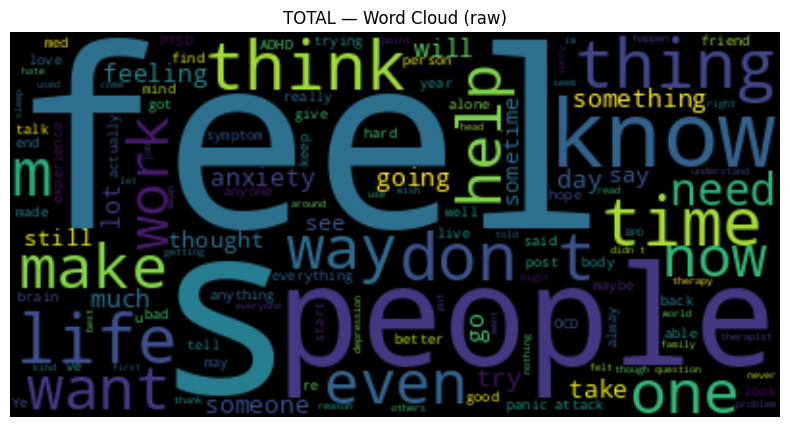

In [9]:
text_all = " ".join(df_wc["wc_text_raw"].tolist())


plt.figure(figsize=(10,5))
WordCloud(width=1400, height=700, background_color="white") \
    .generate(text_all)
plt.imshow(WordCloud().generate(text_all), interpolation="bilinear")
plt.axis("off")
plt.title("TOTAL — Word Cloud (raw)")
plt.show()

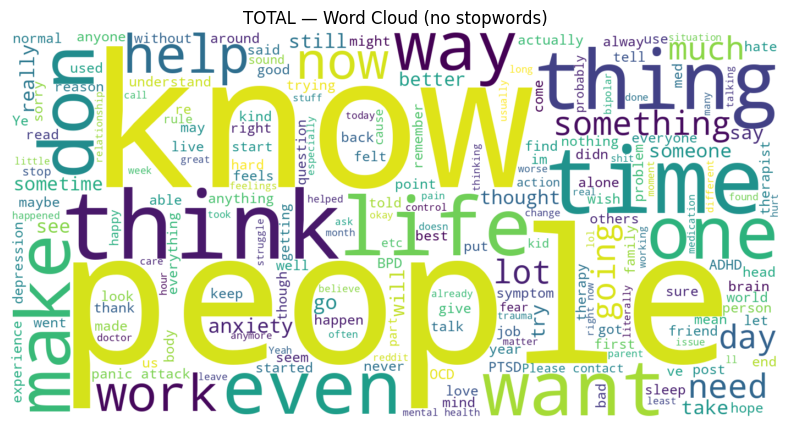

In [10]:
plt.figure(figsize=(10,5))
wc_total_sw = WordCloud(width=1400, height=700, background_color="white", stopwords=CLOUD_STOPWORDS)
plt.imshow(wc_total_sw.generate(text_all), interpolation="bilinear")
plt.axis("off")
plt.title("TOTAL — Word Cloud (no stopwords)")
plt.show()


Class: adhd


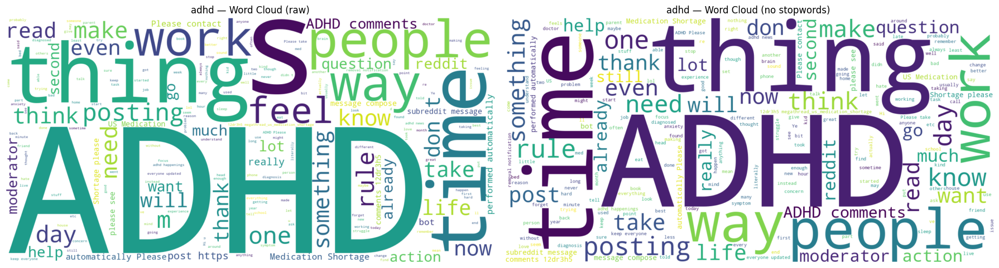


----------------------------------------------------------------------------------------------------

Class: anxiety


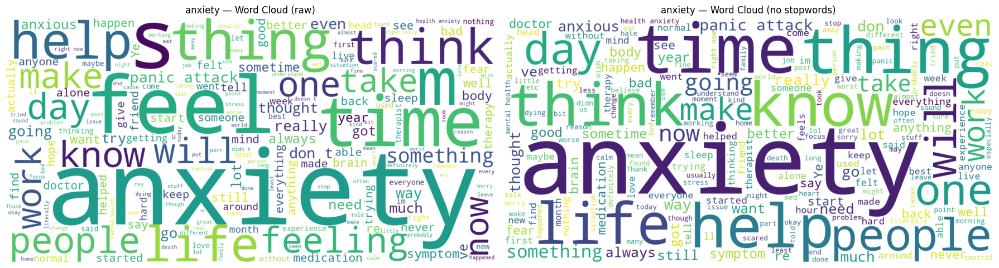


----------------------------------------------------------------------------------------------------

Class: bipolar


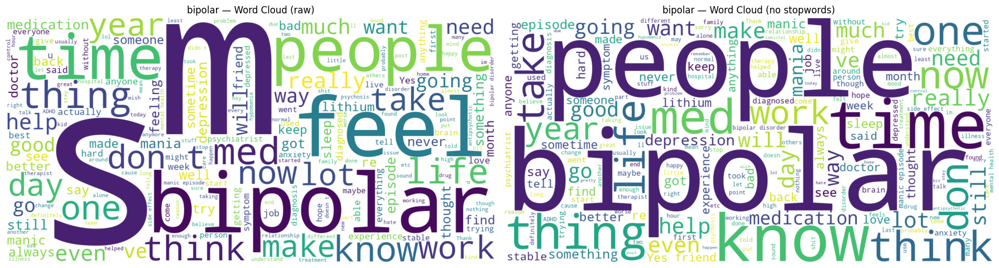


----------------------------------------------------------------------------------------------------

Class: bpd


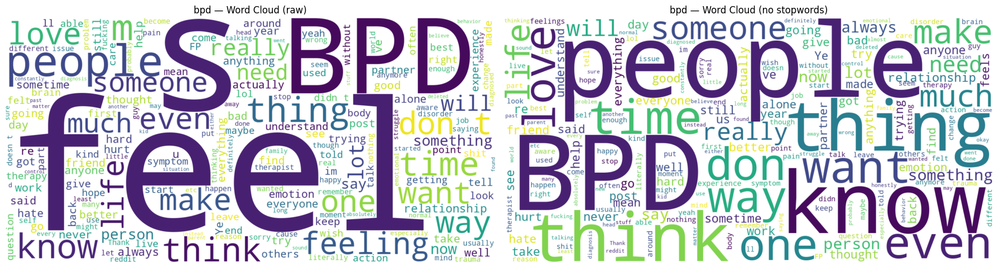


----------------------------------------------------------------------------------------------------

Class: depression


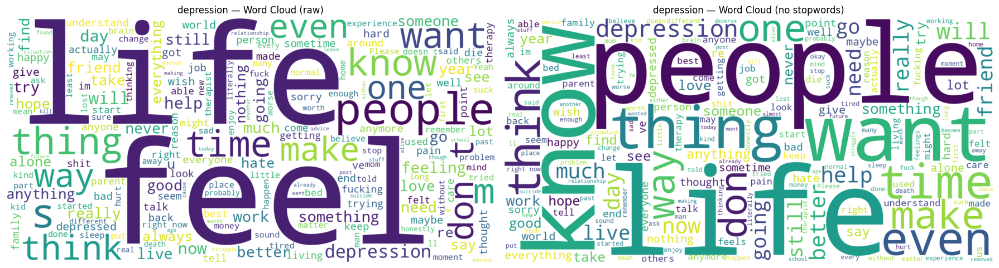


----------------------------------------------------------------------------------------------------

Class: mentalhealth


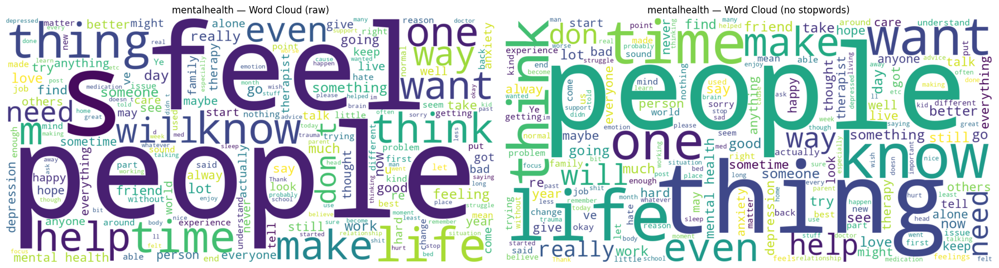


----------------------------------------------------------------------------------------------------

Class: mentalillness


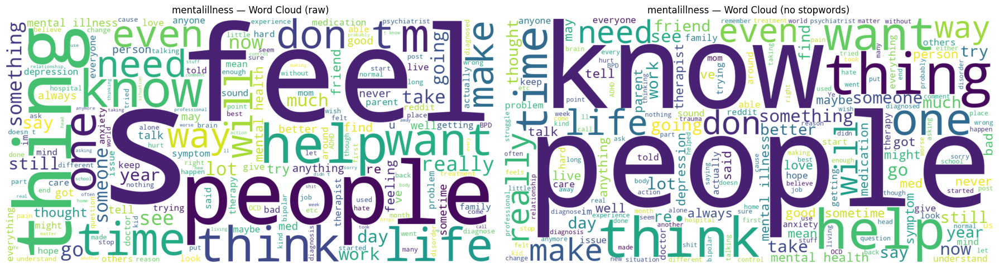


----------------------------------------------------------------------------------------------------

Class: ocd


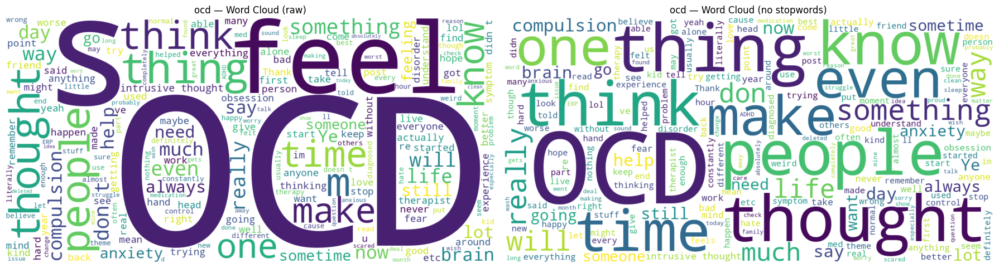


----------------------------------------------------------------------------------------------------

Class: panicattack


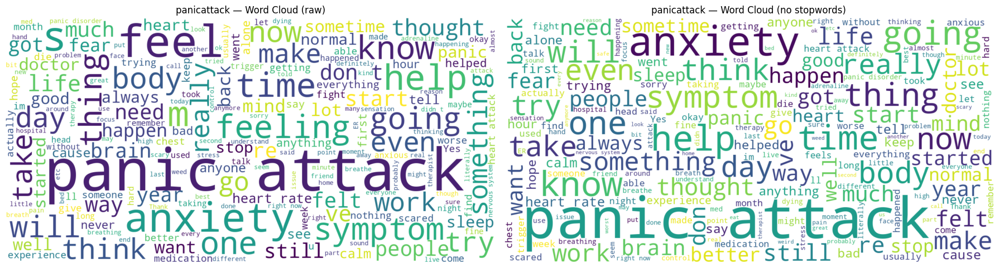


----------------------------------------------------------------------------------------------------

Class: ptsd


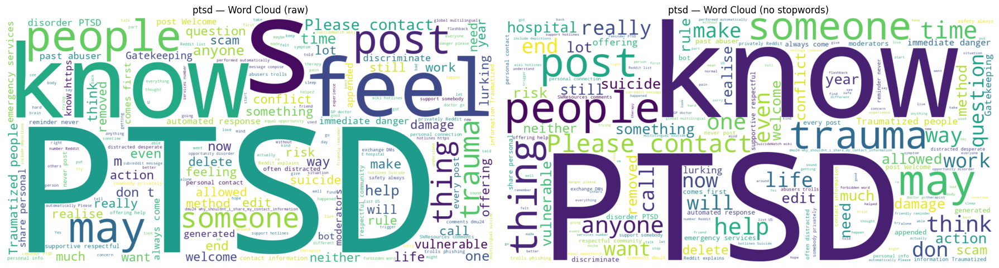


----------------------------------------------------------------------------------------------------

Class: socialanxiety


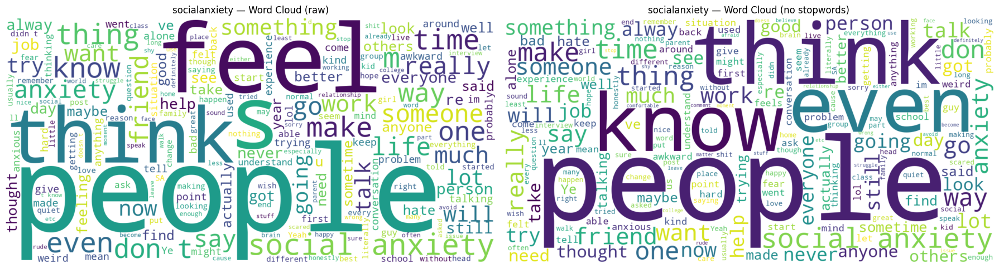


----------------------------------------------------------------------------------------------------

Class: suicidewatch


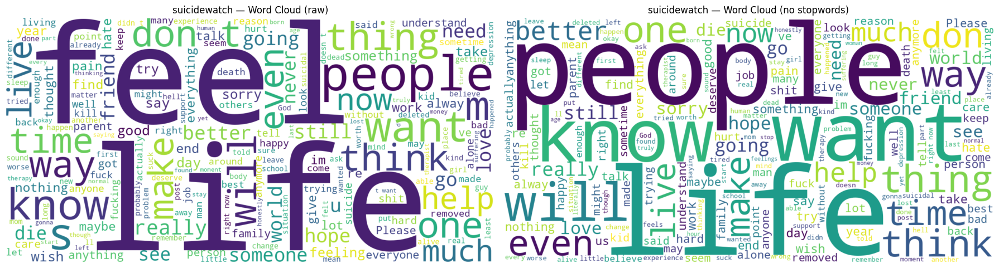


----------------------------------------------------------------------------------------------------



In [11]:
for _, row in per_class_text.iterrows():
    lab = row["category"]
    txt = row["wc_text_raw"]

    # Print class name at the start of the loop
    print(f"Class: {lab}")

    if not isinstance(txt, str) or not txt.strip():
        print("(skipped: empty text)\n" + "-" * 100 + "\n")
        continue

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Raw
    wc = WordCloud(width=1400, height=700, background_color="white", random_state=42)
    axes[0].imshow(wc.generate(txt), interpolation="bilinear")
    axes[0].axis("off")
    axes[0].set_title(f"{lab} — Word Cloud (raw)")

    # Stopwords removed
    wc_sw = WordCloud(width=1400, height=700, background_color="white",
                      stopwords=CLOUD_STOPWORDS, random_state=42)
    axes[1].imshow(wc_sw.generate(txt), interpolation="bilinear")
    axes[1].axis("off")
    axes[1].set_title(f"{lab} — Word Cloud (no stopwords)")

    plt.tight_layout()
    plt.show()

    # Spacing + line after each loop iteration
    print()
    print("-" * 100)
    print()


## Preprocessing 

In [12]:
print("Rows, Cols:", combined_df.shape)
print("\n— Column dtypes —")
display(combined_df.dtypes.to_frame("dtype"))


Rows, Cols: (10439, 8)

— Column dtypes —


,dtype
category,object
Title,object
Author,object
Upvotes,int64
Text,object
Created_At,object
URL,object
Top_10_Comments,object


In [13]:
print("\n— Null counts —")
display(combined_df.isna().sum().to_frame("nulls"))


— Null counts —


,nulls
category,0
Title,0
Author,1350
Upvotes,0
Text,126
Created_At,0
URL,0
Top_10_Comments,59


In [14]:
combined_df = combined_df.drop(columns=["URL", "Author"], errors="ignore")

In [15]:
combined_df = combined_df.dropna(subset=["Title", "Text", "Top_10_Comments"]).reset_index(drop=True)

In [16]:
obj_cols = [c for c in combined_df.columns if combined_df[c].dtype == "object"]
for c in obj_cols:
    # cast to str, strip, collapse spaces
    s = combined_df[c].astype(str)
    s = s.str.replace(r"\s+", " ", regex=True).str.strip()
    # treat "nan" literal that appeared from astype(str)
    s = s.replace({"nan": ""})
    combined_df[c] = s

print("Normalized object columns:", obj_cols[:10], "..." if len(obj_cols) > 10 else "")


Normalized object columns: ['category', 'Title', 'Text', 'Created_At', 'Top_10_Comments'] 


In [17]:
df = combined_df[["category", "Title", "Upvotes", "Text", "Created_At", "Top_10_Comments"]].copy()


In [18]:
print("Rows, Cols:", df.shape)
print("\n— Column dtypes —")
display(df.dtypes.to_frame("dtype"))

Rows, Cols: (10256, 6)

— Column dtypes —


,dtype
category,object
Title,object
Upvotes,int64
Text,object
Created_At,object
Top_10_Comments,object


In [19]:
for c in ["category", "Title", "Text", "Top_10_Comments", "Created_At"]:
    s = df[c].astype(str)
    s = s.str.replace(r"\s+", " ", regex=True).str.strip()
    s = s.replace({"nan": ""})
    df[c] = s

display(df.head(3))

,category,Title,Upvotes,Text,Created_At,Top_10_Comments
0,adhd,My son's ADHD saved his sister's life,15204,My son was only 7 years old when he took a pic...,2024-12-16 02:05:27,Hi /u/Ollie-Branch and thanks for posting on /...
1,adhd,Reminder: If you made it to adulthood with lat...,7577,"We all know the statistics: 20,000 behavioral ...",2024-08-25 00:48:44,Hi /u/Hipster-Deuxbag and thanks for posting o...
2,adhd,Children with higher IQ scores were diagnosed ...,4574,A study was published in the [British Journal ...,2024-11-05 12:24:31,Hi /u/Pretend_Voice_3140 and thanks for postin...


Upvotes nulls: 0
Upvotes negatives: 0


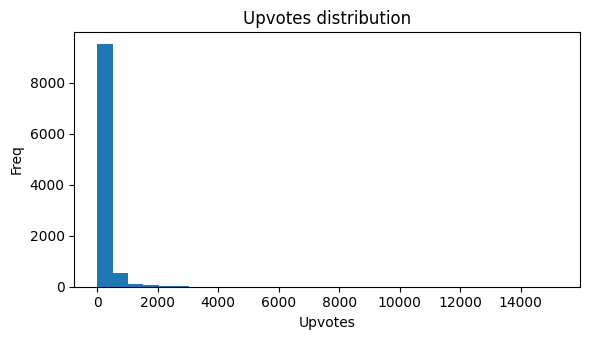

Upvotes 99th percentile: 1448.950000000008


,category,Title,Upvotes,Text,Created_At,Top_10_Comments
0,adhd,My son's ADHD saved his sister's life,15204,My son was only 7 years old when he took a pic...,2024-12-16 02:05:27,Hi /u/Ollie-Branch and thanks for posting on /...
1,adhd,Reminder: If you made it to adulthood with lat...,7577,"We all know the statistics: 20,000 behavioral ...",2024-08-25 00:48:44,Hi /u/Hipster-Deuxbag and thanks for posting o...
2,adhd,Children with higher IQ scores were diagnosed ...,4574,A study was published in the [British Journal ...,2024-11-05 12:24:31,Hi /u/Pretend_Voice_3140 and thanks for postin...
3,adhd,LIFE HACK I JUST DISCOVERED,4378,I feel like I just cracked the Zodiac cipher o...,2024-05-29 02:26:19,Hi /u/expert_in_wumbo and thanks for posting o...
4,adhd,no meds 10 months. i'm barely recognizable,3814,"10 months ago I ran into a NP that ""doesn't pe...",2024-07-09 14:10:26,Hi /u/rainjoyed and thanks for posting on /r/A...
5,adhd,My auditory processing disorder make me feel r...,3782,"So, like a lot of people with ADHD I have audi...",2024-11-24 13:37:47,Hi /u/TALA1996 and thanks for posting on /r/AD...
6,adhd,I removed all distractions and stared at a wal...,3717,"I’ve put away all distractions (PC, playstatio...",2024-09-30 06:54:23,Hi /u/AussieSpender and thanks for posting on ...
7,adhd,Being Japanese with ADHD is a nightmare,3495,The Japanese culture and ADHD are a terrible m...,2024-08-17 02:56:57,Hi /u/Ok_Medium1628 and thanks for posting on ...
8,adhd,Found an ADHD cleaning hack that has dramatica...,3430,"I, like many ADHD crew, struggle to stay on ta...",2024-09-16 04:47:07,Hi /u/WhatAFineWasteOfTime and thanks for post...
9,adhd,Good News Everyone! My Boss has Discovered the...,3359,All you have to do is make lists and set deadl...,2024-05-16 18:11:54,Hi /u/vallikat and thanks for posting on /r/AD...


In [20]:
# coerce to numeric safely; cast to Int64 (nullable int) to keep NaNs if any
u = pd.to_numeric(df["Upvotes"], errors="coerce")
df["Upvotes"] = u.astype("Int64")

print("Upvotes nulls:", int(df["Upvotes"].isna().sum()))
print("Upvotes negatives:", int((df["Upvotes"].fillna(0) < 0).sum()))

# simple distribution check
plt.figure(figsize=(6,3.5))
df["Upvotes"].dropna().astype(int).plot(kind="hist", bins=30, title="Upvotes distribution")
plt.xlabel("Upvotes"); plt.ylabel("Freq")
plt.tight_layout(); plt.show()

# quick outlier thresholds (non-destructive; for inspection)
q99 = df["Upvotes"].dropna().quantile(0.99) if df["Upvotes"].notna().any() else np.nan
print("Upvotes 99th percentile:", q99)
display(df.loc[df["Upvotes"] >= q99].head(10))


Created_At nulls (raw): 0
created_dt nulls (parsed): 0


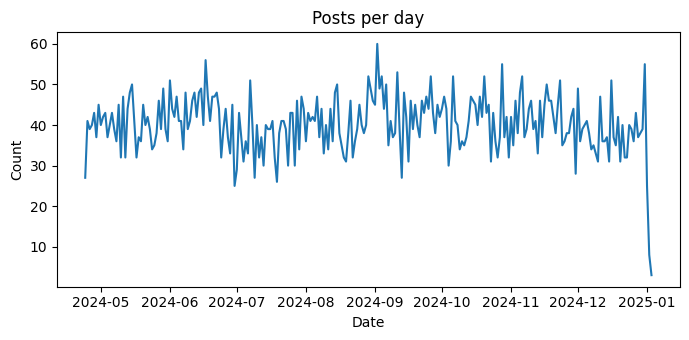

In [21]:
# 1) numeric seconds since epoch (if numeric-like)
num = pd.to_numeric(df["Created_At"], errors="coerce")
dt_from_epoch = pd.to_datetime(num, unit="s", errors="coerce")

# 2) general string datetime
dt_from_str = pd.to_datetime(df["Created_At"], errors="coerce")

# prefer epoch-parse when available, else fall back to general parse
df["created_dt"] = dt_from_epoch.fillna(dt_from_str)

print("Created_At nulls (raw):", int((df["Created_At"] == "").sum()))
print("created_dt nulls (parsed):", int(df["created_dt"].isna().sum()))

# simple time distribution (if present)
if df["created_dt"].notna().any():
    tmp = df.loc[df["created_dt"].notna()].copy()
    tmp["date"] = tmp["created_dt"].dt.date
    counts = tmp["date"].value_counts().sort_index()
    plt.figure(figsize=(7,3.5))
    counts.plot(kind="line", title="Posts per day")
    plt.xlabel("Date"); plt.ylabel("Count")
    plt.tight_layout(); plt.show()


In [22]:
# Top_10_Comments may be list-like encoded as a string or actual lists.
# Minimal approach: treat as string and rely on whitespace collapse from earlier.
comments_str = df["Top_10_Comments"]

# unified text for analysis/modeling
df["unified_text"] = (df["Title"] + " " + df["Text"] + " " + comments_str).str.replace(r"\s+", " ", regex=True).str.strip()

df["char_len"]  = df["unified_text"].str.len()
df["token_cnt"] = df["unified_text"].str.split().str.len()

print("Empty unified_text:", int((df["unified_text"] == "").sum()))
display(df[["Title","Text","Top_10_Comments","unified_text"]].head(3))
display(df[["char_len","token_cnt"]].describe())


Empty unified_text: 0


,Title,Text,Top_10_Comments,unified_text
0,My son's ADHD saved his sister's life,My son was only 7 years old when he took a pic...,Hi /u/Ollie-Branch and thanks for posting on /...,My son's ADHD saved his sister's life My son w...
1,Reminder: If you made it to adulthood with lat...,"We all know the statistics: 20,000 behavioral ...",Hi /u/Hipster-Deuxbag and thanks for posting o...,Reminder: If you made it to adulthood with lat...
2,Children with higher IQ scores were diagnosed ...,A study was published in the [British Journal ...,Hi /u/Pretend_Voice_3140 and thanks for postin...,Children with higher IQ scores were diagnosed ...


,char_len,token_cnt
count,10256.000000,10256.000000
mean,3698.174239,683.471529
std,2168.762583,396.201694
min,19.000000,5.000000
25%,2164.000000,406.000000
50%,3313.500000,613.000000
75%,4791.250000,877.000000
max,33558.000000,6118.000000


In [23]:
n0 = len(df)
mask_nonempty = df["unified_text"] != ""
mask_long_enough = df["token_cnt"] > 3
df = df[mask_nonempty & mask_long_enough].copy()
print("Dropped empty/very short rows:", n0 - len(df))

Dropped empty/very short rows: 0


In [24]:
n_before = len(df)

# content-based dedup
df["_dup_key"] = df["unified_text"].str.lower()
df = df.drop_duplicates(subset=["_dup_key"]).copy()

print("Removed duplicate texts:", n_before - len(df))
df = df.drop(columns=["_dup_key"])

Removed duplicate texts: 0


In [25]:
cls_counts = df["category"].value_counts().rename_axis("category").reset_index(name="count")
print("Class counts:")
display(cls_counts)

tiny = cls_counts[cls_counts["count"] < 20]
if len(tiny) > 0:
    print("Classes with < 20 rows (review these):")
    display(tiny)

Class counts:


,category,count
0,adhd,962
1,socialanxiety,929
2,panicattack,917
3,anxiety,908
4,bipolar,880
5,ptsd,878
6,bpd,875
7,mentalillness,862
8,depression,847
9,ocd,771


In [26]:
df.head(5)

,category,Title,Upvotes,Text,Created_At,Top_10_Comments,created_dt,unified_text,char_len,token_cnt
0,adhd,My son's ADHD saved his sister's life,15204,My son was only 7 years old when he took a pic...,2024-12-16 02:05:27,Hi /u/Ollie-Branch and thanks for posting on /...,2024-12-16 02:05:27,My son's ADHD saved his sister's life My son w...,5915,1080
1,adhd,Reminder: If you made it to adulthood with lat...,7577,"We all know the statistics: 20,000 behavioral ...",2024-08-25 00:48:44,Hi /u/Hipster-Deuxbag and thanks for posting o...,2024-08-25 00:48:44,Reminder: If you made it to adulthood with lat...,4944,860
2,adhd,Children with higher IQ scores were diagnosed ...,4574,A study was published in the [British Journal ...,2024-11-05 12:24:31,Hi /u/Pretend_Voice_3140 and thanks for postin...,2024-11-05 12:24:31,Children with higher IQ scores were diagnosed ...,6443,1114
3,adhd,LIFE HACK I JUST DISCOVERED,4378,I feel like I just cracked the Zodiac cipher o...,2024-05-29 02:26:19,Hi /u/expert_in_wumbo and thanks for posting o...,2024-05-29 02:26:19,LIFE HACK I JUST DISCOVERED I feel like I just...,3388,609
4,adhd,no meds 10 months. i'm barely recognizable,3814,"10 months ago I ran into a NP that ""doesn't pe...",2024-07-09 14:10:26,Hi /u/rainjoyed and thanks for posting on /r/A...,2024-07-09 14:10:26,no meds 10 months. i'm barely recognizable 10 ...,4708,850


In [27]:
keepers = [
    "category", "Title", "Text", "Top_10_Comments",
    "Upvotes", "Created_At", "created_dt",
    "unified_text", "char_len", "token_cnt"
]
df = df[keepers].copy()

# tidy types (nullable int kept for Upvotes)
df["category"] = df["category"].astype(str)
df["Title"]    = df["Title"].astype(str)
df["Text"]     = df["Text"].astype(str)
df["Top_10_Comments"] = df["Top_10_Comments"].astype(str)

print("Final shape:", df.shape)
print("\n— Final dtypes —")
display(df.dtypes.to_frame("dtype"))

print("\n— Final null counts —")
display(df.isna().sum().to_frame("nulls"))

display(df.head())

Final shape: (10256, 10)

— Final dtypes —


,dtype
category,object
Title,object
Text,object
Top_10_Comments,object
Upvotes,Int64
Created_At,object
created_dt,datetime64[ns]
unified_text,object
char_len,int64
token_cnt,int64



— Final null counts —


,nulls
category,0
Title,0
Text,0
Top_10_Comments,0
Upvotes,0
Created_At,0
created_dt,0
unified_text,0
char_len,0
token_cnt,0


,category,Title,Text,Top_10_Comments,Upvotes,Created_At,created_dt,unified_text,char_len,token_cnt
0,adhd,My son's ADHD saved his sister's life,My son was only 7 years old when he took a pic...,Hi /u/Ollie-Branch and thanks for posting on /...,15204,2024-12-16 02:05:27,2024-12-16 02:05:27,My son's ADHD saved his sister's life My son w...,5915,1080
1,adhd,Reminder: If you made it to adulthood with lat...,"We all know the statistics: 20,000 behavioral ...",Hi /u/Hipster-Deuxbag and thanks for posting o...,7577,2024-08-25 00:48:44,2024-08-25 00:48:44,Reminder: If you made it to adulthood with lat...,4944,860
2,adhd,Children with higher IQ scores were diagnosed ...,A study was published in the [British Journal ...,Hi /u/Pretend_Voice_3140 and thanks for postin...,4574,2024-11-05 12:24:31,2024-11-05 12:24:31,Children with higher IQ scores were diagnosed ...,6443,1114
3,adhd,LIFE HACK I JUST DISCOVERED,I feel like I just cracked the Zodiac cipher o...,Hi /u/expert_in_wumbo and thanks for posting o...,4378,2024-05-29 02:26:19,2024-05-29 02:26:19,LIFE HACK I JUST DISCOVERED I feel like I just...,3388,609
4,adhd,no meds 10 months. i'm barely recognizable,"10 months ago I ran into a NP that ""doesn't pe...",Hi /u/rainjoyed and thanks for posting on /r/A...,3814,2024-07-09 14:10:26,2024-07-09 14:10:26,no meds 10 months. i'm barely recognizable 10 ...,4708,850


## Exploring the Dataset

In [28]:
# keep only rows with a valid datetime for date-based plots
df_time = df[df["created_dt"].notna()].copy()

# daily / weekly / monthly anchors (timestamps)
df_time["day"]   = df_time["created_dt"].dt.floor("D")
df_time["week"]  = df_time["created_dt"].dt.to_period("W").dt.start_time
df_time["month"] = df_time["created_dt"].dt.to_period("M").dt.to_timestamp()

# numeric upvotes array for plotting
upv = pd.to_numeric(df["Upvotes"], errors="coerce")

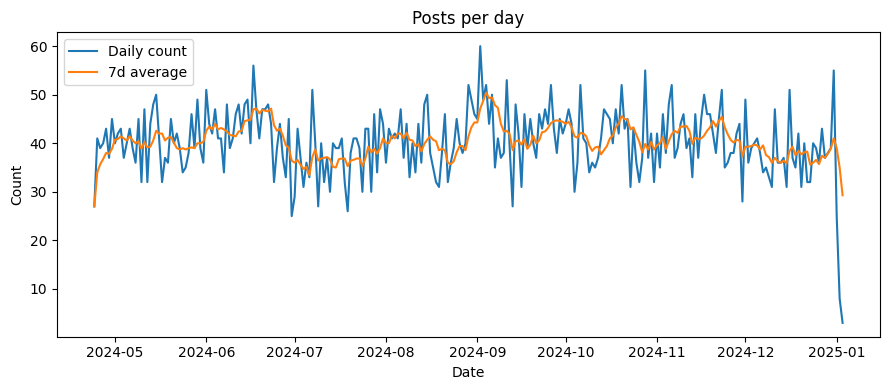

In [29]:
counts_day = df_time.groupby("day").size().sort_index()
roll7 = counts_day.rolling(7, min_periods=1).mean()

plt.figure(figsize=(9,4))
plt.plot(counts_day.index, counts_day.values, label="Daily count")
plt.plot(roll7.index, roll7.values, label="7d average")
plt.title("Posts per day")
plt.xlabel("Date"); plt.ylabel("Count")
plt.legend()
plt.tight_layout(); plt.show()


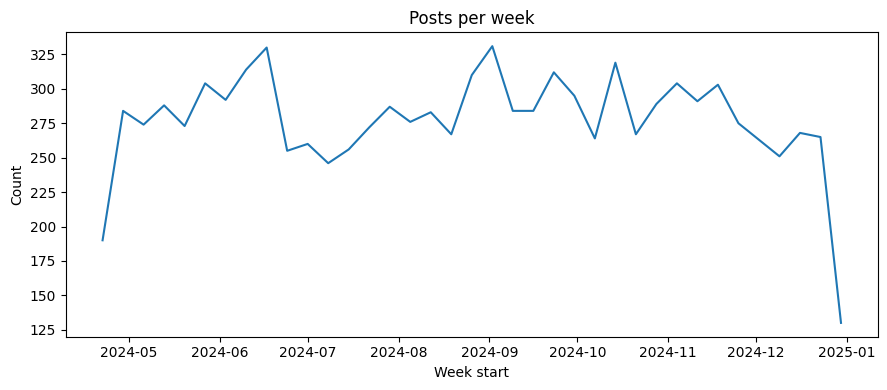

In [30]:
counts_week = df_time.groupby("week").size().sort_index()

plt.figure(figsize=(9,4))
plt.plot(counts_week.index, counts_week.values)
plt.title("Posts per week")
plt.xlabel("Week start"); plt.ylabel("Count")
plt.tight_layout(); plt.show()


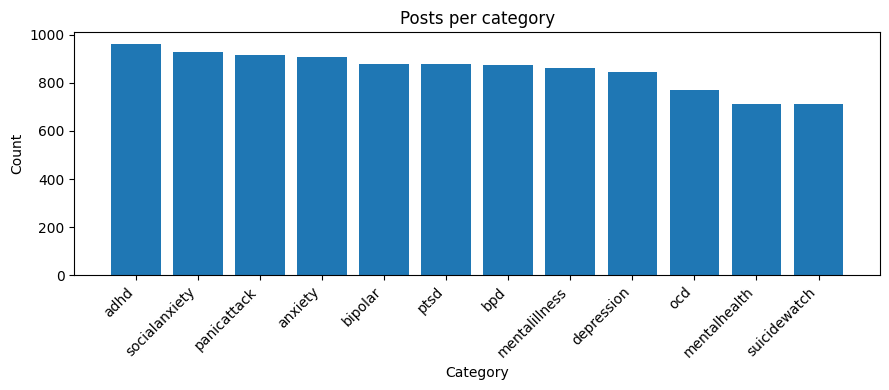

,category,count
0,adhd,962
1,socialanxiety,929
2,panicattack,917
3,anxiety,908
4,bipolar,880
5,ptsd,878
6,bpd,875
7,mentalillness,862
8,depression,847
9,ocd,771


In [31]:
cat_counts = df["category"].value_counts().rename_axis("category").reset_index(name="count").sort_values("count", ascending=False)

plt.figure(figsize=(9,4))
plt.bar(cat_counts["category"], cat_counts["count"])
plt.title("Posts per category")
plt.xlabel("Category"); plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()

display(cat_counts.head(20))


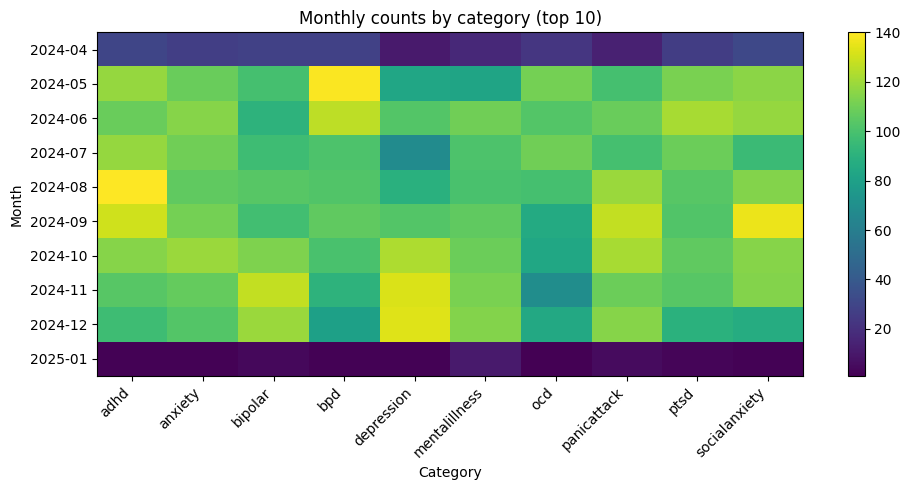

category,adhd,anxiety,bipolar,bpd,depression,mentalillness,ocd,panicattack,ptsd,socialanxiety
month,,,,,,,,,,
2024-04-01,30,27,28,28,11,17,23,14,26,31
2024-05-01,118,108,99,139,83,82,111,99,112,116
2024-06-01,108,115,91,126,103,110,103,108,122,118
2024-07-01,118,110,97,101,68,101,110,99,109,96
2024-08-01,140,106,104,102,89,100,99,119,104,114
2024-09-01,130,111,98,106,103,106,86,127,102,136
2024-10-01,115,119,113,100,123,109,84,122,106,115
2024-11-01,104,107,127,91,132,112,69,109,104,114
2024-12-01,97,103,119,80,133,114,85,115,90,87


In [32]:
top10 = cat_counts["category"].head(10).tolist()
month_cat = (
    df_time[df_time["category"].isin(top10)]
    .groupby(["month","category"])
    .size()
    .reset_index(name="count")
    .pivot(index="month", columns="category", values="count")
    .fillna(0)
    .sort_index()
)

plt.figure(figsize=(10,5))
plt.imshow(month_cat.values, aspect="auto")
plt.title("Monthly counts by category (top 10)")
plt.xlabel("Category"); plt.ylabel("Month")
plt.colorbar()
plt.xticks(ticks=np.arange(len(month_cat.columns)), labels=month_cat.columns, rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(month_cat.index)), labels=[d.strftime("%Y-%m") for d in month_cat.index])
plt.tight_layout(); plt.show()

display(month_cat.tail(12))


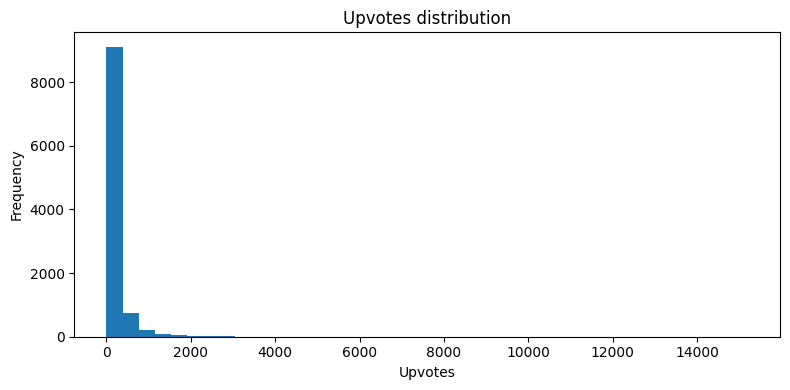

Upvotes summary:


,Upvotes
count,10256.0
mean,174.009945
std,338.572308
min,3.0
25%,26.0
50%,80.0
75%,177.0
max,15204.0


In [33]:
plt.figure(figsize=(8,4))
pd.Series(upv.dropna().astype(int)).plot(kind="hist", bins=40, title="Upvotes distribution")
plt.xlabel("Upvotes"); plt.ylabel("Frequency")
plt.tight_layout(); plt.show()

print("Upvotes summary:")
display(pd.Series(upv).describe().to_frame("Upvotes"))

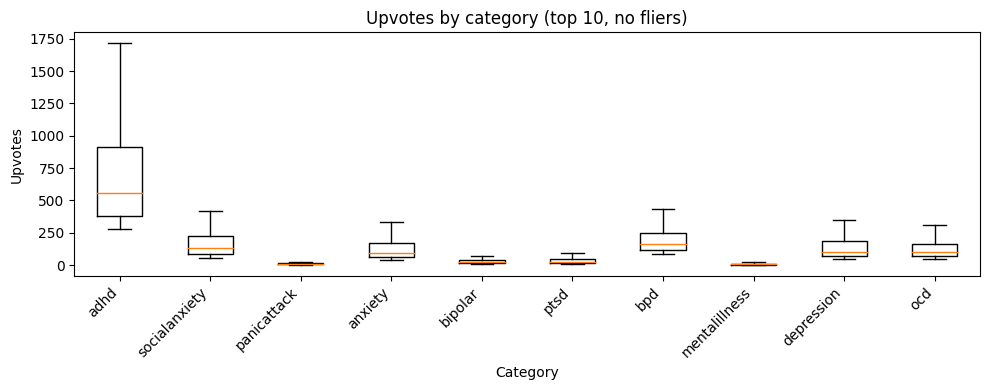

In [34]:
df_up = df[["category","Upvotes"]].copy()
df_up["Upvotes"] = pd.to_numeric(df_up["Upvotes"], errors="coerce")

order10 = df["category"].value_counts().head(10).index.tolist()
data_for_box = [df_up.loc[df_up["category"] == c, "Upvotes"].dropna().values for c in order10]

plt.figure(figsize=(10,4))
plt.boxplot(data_for_box, labels=order10, showfliers=False)
plt.title("Upvotes by category (top 10, no fliers)")
plt.xlabel("Category"); plt.ylabel("Upvotes")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()


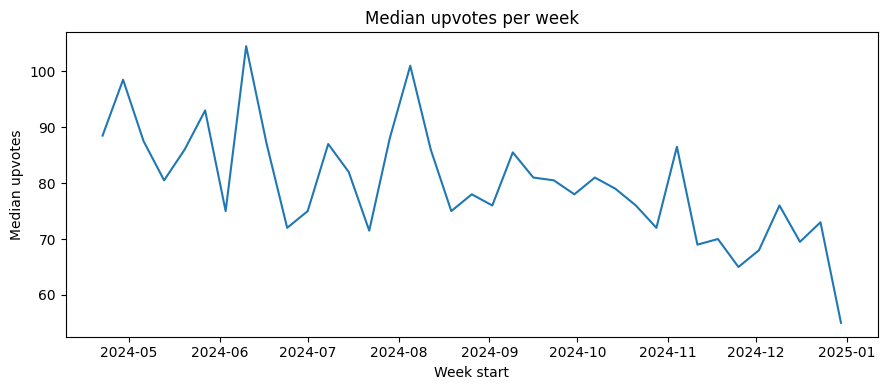

,median_upvotes
week,
2024-10-28,72.0
2024-11-04,86.5
2024-11-11,69.0
2024-11-18,70.0
2024-11-25,65.0
2024-12-02,68.0
2024-12-09,76.0
2024-12-16,69.5
2024-12-23,73.0


In [35]:
df_time["Upvotes"] = pd.to_numeric(df_time["Upvotes"], errors="coerce")
weekly_upvotes = df_time.groupby("week")["Upvotes"].median().dropna().sort_index()

plt.figure(figsize=(9,4))
plt.plot(weekly_upvotes.index, weekly_upvotes.values)
plt.title("Median upvotes per week")
plt.xlabel("Week start"); plt.ylabel("Median upvotes")
plt.tight_layout(); plt.show()

display(weekly_upvotes.tail(10).to_frame("median_upvotes"))


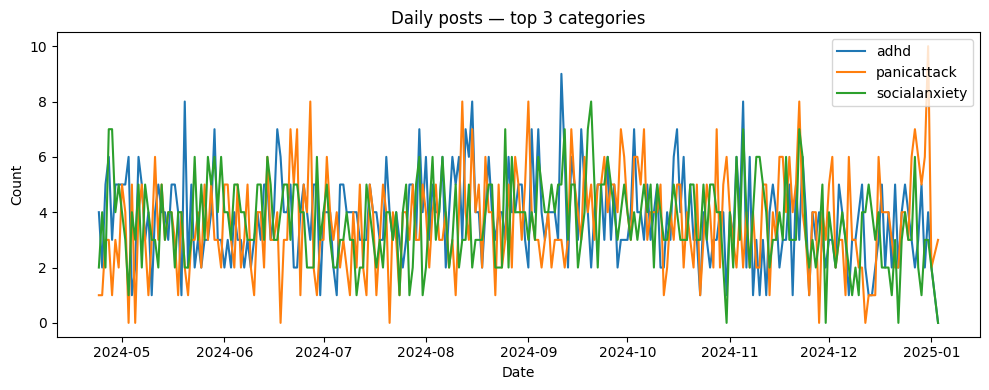

category,adhd,panicattack,socialanxiety
day,,,
2024-12-20,2.0,3.0,1.0
2024-12-21,5.0,2.0,3.0
2024-12-22,2.0,2.0,0.0
2024-12-23,4.0,4.0,3.0
2024-12-24,5.0,4.0,4.0
2024-12-25,4.0,3.0,3.0
2024-12-26,3.0,6.0,3.0
2024-12-27,2.0,7.0,6.0
2024-12-28,3.0,6.0,2.0


In [36]:
top3 = cat_counts["category"].head(3).tolist()
daily_top3 = (
    df_time[df_time["category"].isin(top3)]
    .groupby(["day","category"])
    .size()
    .reset_index(name="count")
    .pivot(index="day", columns="category", values="count")
    .fillna(0)
    .sort_index()
)

plt.figure(figsize=(10,4))
for c in daily_top3.columns:
    plt.plot(daily_top3.index, daily_top3[c].values, label=c)
plt.title("Daily posts — top 3 categories")
plt.xlabel("Date"); plt.ylabel("Count")
plt.legend()
plt.tight_layout(); plt.show()

display(daily_top3.tail(14))


## Classification Model

In [37]:
RANDOM_STATE = 42

In [38]:
X_text = df["unified_text"].astype(str).values
y_labels = df["category"].astype(str).values

In [39]:
le = LabelEncoder()
y = le.fit_transform(y_labels)

# split ONLY X_text and y → returns 4 arrays
X_train, X_test, y_train, y_test = train_test_split(
    X_text, y, test_size=0.2, random_state=RANDOM_STATE, stratify=y
)

In [40]:
y_labels_test = le.inverse_transform(y_test)

len(le.classes_), le.classes_[:10]

(12,
 array(['adhd', 'anxiety', 'bipolar', 'bpd', 'depression', 'mentalhealth',
        'mentalillness', 'ocd', 'panicattack', 'ptsd'], dtype=object))

In [41]:
vectorizer = TfidfVectorizer(ngram_range=(1,2), min_df=3, max_features=200_000)
Xtr = vectorizer.fit_transform(X_train)
Xte = vectorizer.transform(X_test)
Xtr.shape, Xte.shape


((8204, 200000), (2052, 200000))

In [42]:
classes = np.unique(y_train)
weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weight_map = {c: w for c, w in zip(classes, weights)}

base = LinearSVC(class_weight=class_weight_map)
clf = CalibratedClassifierCV(base, method="sigmoid", cv=3)
clf.fit(Xtr, y_train)

y_pred  = clf.predict(Xte)
y_proba = clf.predict_proba(Xte)  # shape: [n_samples, n_classes]
y_pred[:5], y_proba.shape


(array([10,  7,  1,  1,  9]), (2052, 12))

=== Multiclass classification report ===
               precision    recall  f1-score   support

         adhd       1.00      1.00      1.00       193
      anxiety       0.80      0.74      0.77       182
      bipolar       0.86      0.86      0.86       176
          bpd       0.89      0.93      0.91       175
   depression       0.56      0.61      0.59       169
 mentalhealth       0.61      0.55      0.58       143
mentalillness       0.69      0.63      0.66       172
          ocd       0.94      0.97      0.96       154
  panicattack       0.90      0.90      0.90       183
         ptsd       1.00      1.00      1.00       176
socialanxiety       0.86      0.93      0.89       186
 suicidewatch       0.63      0.64      0.63       143

     accuracy                           0.82      2052
    macro avg       0.81      0.81      0.81      2052
 weighted avg       0.82      0.82      0.82      2052



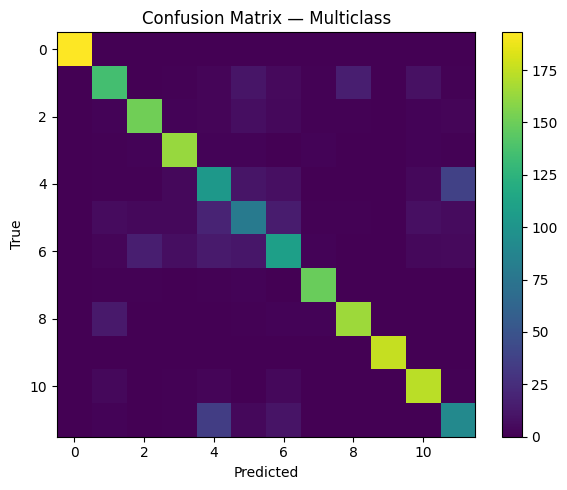

In [43]:
print("=== Multiclass classification report ===")
print(classification_report(y_test, y_pred, target_names=le.classes_))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6,5))
plt.imshow(cm, aspect="auto")
plt.title("Confusion Matrix — Multiclass")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.colorbar()
plt.tight_layout(); plt.show()


In [44]:
ap_scores = []
for i, cls_name in enumerate(le.classes_):
    y_true_bin = (y_test == i).astype(int)
    ap = float(average_precision_score(y_true_bin, y_proba[:, i]))
    ap_scores.append((cls_name, ap))

ap_df = pd.DataFrame(ap_scores, columns=["class","PR_AUC"]).sort_values("PR_AUC", ascending=False)
ap_df.head(20)


,class,PR_AUC
0,adhd,1.000000
9,ptsd,1.000000
7,ocd,0.969410
3,bpd,0.964359
10,socialanxiety,0.959934
8,panicattack,0.933252
2,bipolar,0.927601
1,anxiety,0.852549
6,mentalillness,0.746218
11,suicidewatch,0.654374


In [45]:
def predict_topk(title="", text="", comments="", k=5):
    s = (str(title) + " " + str(text) + " " + str(comments)).strip()
    s = " ".join(s.split())
    Xv = vectorizer.transform([s])
    probs = clf.predict_proba(Xv)[0]
    idx = np.argsort(probs)[::-1][:k]
    return pd.DataFrame({"class": le.classes_[idx], "probability": probs[idx]})

# demo
predict_topk(
    title="I can't sleep and my heart keeps racing",
    text="feeling tense all day and worrying about everything",
    comments="have you tried breathing exercises? | talk to someone you trust"
)


,class,probability
0,mentalillness,0.599699
1,panicattack,0.166839
2,anxiety,0.086465
3,depression,0.063156
4,mentalhealth,0.045316


## Model 2

In [46]:
vectorizer_lr = TfidfVectorizer(ngram_range=(1,2), min_df=3, max_features=200_000)
Xtr_lr = vectorizer_lr.fit_transform(X_train)
Xte_lr = vectorizer_lr.transform(X_test)
Xtr_lr.shape, Xte_lr.shape

((8204, 200000), (2052, 200000))

=== Multiclass Logistic Regression — classification report ===
               precision    recall  f1-score   support

         adhd       0.99      0.99      0.99       193
      anxiety       0.77      0.73      0.75       182
      bipolar       0.86      0.82      0.84       176
          bpd       0.87      0.87      0.87       175
   depression       0.55      0.55      0.55       169
 mentalhealth       0.52      0.52      0.52       143
mentalillness       0.66      0.54      0.60       172
          ocd       0.95      0.96      0.95       154
  panicattack       0.90      0.88      0.89       183
         ptsd       1.00      1.00      1.00       176
socialanxiety       0.83      0.90      0.86       186
 suicidewatch       0.55      0.68      0.61       143

     accuracy                           0.80      2052
    macro avg       0.79      0.79      0.79      2052
 weighted avg       0.80      0.80      0.79      2052



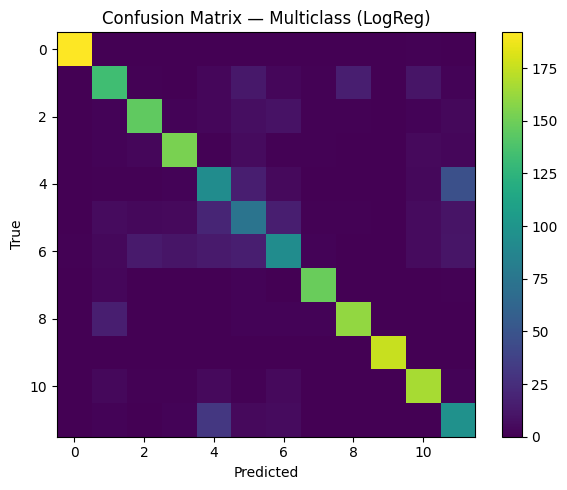

,class,PR_AUC
9,ptsd,1.000000
0,adhd,0.999946
7,ocd,0.957515
3,bpd,0.953219
10,socialanxiety,0.926484
8,panicattack,0.916554
2,bipolar,0.897583
1,anxiety,0.792580
6,mentalillness,0.682289
11,suicidewatch,0.653500


In [47]:
classes = np.unique(y_train)
weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
cw_map = {c: w for c, w in zip(classes, weights)}

# SAGA works well with large, sparse TF-IDF; multinomial handles multi-class directly
logreg_multi = LogisticRegression(
    solver="saga",
    multi_class="multinomial",
    penalty="l2",
    class_weight=cw_map,
    max_iter=3000,
    verbose=0
)
logreg_multi.fit(Xtr_lr, y_train)

y_pred_lr  = logreg_multi.predict(Xte_lr)
y_proba_lr = logreg_multi.predict_proba(Xte_lr)  # [n_samples, n_classes]

print("=== Multiclass Logistic Regression — classification report ===")
print(classification_report(y_test, y_pred_lr, target_names=le.classes_))

cm_lr = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(6,5))
plt.imshow(cm_lr, aspect="auto")
plt.title("Confusion Matrix — Multiclass (LogReg)")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.colorbar(); plt.tight_layout(); plt.show()

ap_scores = []
for i, cls_name in enumerate(le.classes_):
    ap = float(average_precision_score((y_test==i).astype(int), y_proba_lr[:, i]))
    ap_scores.append((cls_name, ap))
pd.DataFrame(ap_scores, columns=["class","PR_AUC"]).sort_values("PR_AUC", ascending=False).head(20)


In [48]:
def predict_topk_logreg(title="", text="", comments="", k=5):
    s = (str(title) + " " + str(text) + " " + str(comments)).strip()
    s = " ".join(s.split())
    Xv = vectorizer_lr.transform([s])
    probs = logreg_multi.predict_proba(Xv)[0]
    idx = np.argsort(probs)[::-1][:k]
    return pd.DataFrame({"class": le.classes_[idx], "probability": probs[idx]})

# demo
predict_topk_logreg(
    title="I can't sleep and my heart keeps racing",
    text="feeling tense and worried all day",
    comments="try talking to someone you trust"
)


,class,probability
0,mentalillness,0.266456
1,panicattack,0.171461
2,anxiety,0.099955
3,bipolar,0.088063
4,mentalhealth,0.080048


## LLM

In [71]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "google/flan-t5-small"  # small, capable, easy to fine-tune
OUTPUT_DIR = "/kaggle/working/mh_llm_flan_t5_small"
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [50]:
use_cols = ["category", "Title", "Text", "Top_10_Comments"]
tmp = df[use_cols].copy()

# Minimal category-specific tips (extend as you wish)
tips_map = {
    "ptsd": (
        "Use grounding (5-4-3-2-1 senses) and gentle orientation to the room. "
        "Name triggers and plan soothing exits after exposures. Keep routines predictable, "
        "add one calming anchor (breath, music, touch), and debrief with someone you trust."
    ),
    "adhd": (
        "Externalize tasks (visible lists, timers), body-double with a friend, and break work into micro-steps "
        "you can finish in minutes. Reduce friction (clear the desk, one tab), and celebrate shipped, not perfect."
    ),
    "ocd": (
        "Label obsessions as thoughts, not facts. Delay or shorten rituals by a minute, then by two. "
        "Practice ‘leaning into uncertainty’ while taking small, values-based actions."
    ),
    "bpd": (
        "Name emotions early. Use STOP/wise-mind: pause, breathe, choose one value-fit action. "
        "Try opposite action for urges, add sensory self-soothe, and set kind, firm boundaries."
    ),
    "socialanxiety": (
        "Plan one tiny exposure (e.g., a greeting). Prepare a short script, breathe slowly (longer exhale), "
        "drop safety behaviors (over-rehearsal, hiding), and debrief with self-compassion."
    ),
    "panicattack": (
        "Ride the wave: soften gaze, lengthen the exhale, feel feet on the floor, name five things you see. "
        "Panic peaks and passes—let it crest while you breathe and keep posture open."
    ),
    "bipolar": (
        "Protect sleep/wake times, keep routines steady, and track mood/energy. "
        "Avoid big swings (caffeine/alcohol), add daylight movement, and share changes early with supports."
    ),
    "anxiety": (
        "Slow breathing (inhale 4, hold 4, exhale 6), limit caffeine and doom-scrolling, "
        "write worries + one doable next step, and return attention to a present-moment anchor."
    ),
    "mentalillness": (
        "Stabilize basics (sleep, food, movement, daylight), reduce overload, and take one kind, tiny step today. "
        "Name what helps, ask for practical support, and pace yourself without self-blame."
    ),
    "suicidewatch": (
        "If you’re in immediate danger or thinking about harming yourself, contact your local emergency number now. "
        "Reach out to someone you trust and remove access to means if possible. You deserve support and safety."
    ),
    "depression": (
        "Start small: consistent wake time, two-minute movement, sunlight if you can, and one easy, finishable task. "
        "Lower the bar with kindness and connect with someone safe today."
    ),
    "mentalhealth": (
        "Keep a simple daily scaffold: regular sleep, brief movement, sunlight, hydration, and one social touchpoint. "
        "Plan tiny wins, schedule rest, and review what actually helped each evening."
    ),
}


GENERIC_TIPS_LIST = [
    "Track sleep, food, movement, and social contact.",
    "Use small, doable steps; lower the bar and celebrate tiny wins.",
    "Get morning light and keep a consistent wake time.",
    "Add a two-minute movement break or stretch.",
    "Practice a breathing set (inhale 4, hold 4, exhale 6) a few times a day.",
    "Limit caffeine/alcohol and reduce late-night screen time.",
    "Name your feelings; write one page to clear the mind.",
    "Make a ‘could-do’ list with one task you can finish in 10 minutes.",
    "Schedule a micro-connection: message a friend or sit near others.",
    "Build a simple wind-down ritual before bed.",
    "Reduce doom-scrolling by setting app timers or charging the phone outside the bedroom.",
    "Create one tiny pleasure anchor (music, shower, tea, sunlight).",
    "Use self-talk a friend would use; drop harsh inner criticism.",
    "Step outside daily and notice three things you can see, hear, or feel.",
    "When overwhelmed, choose the next right action, not the perfect one.",
    "Share how you’re doing with someone you trust; ask for one small piece of help."
]

generic_tips = " ".join(GENERIC_TIPS_LIST)

# Build INPUT and TARGET strings (no functions, just vectorized operations)
post_header = "You are a supportive, non-clinical assistant. Task: read the user's post and write an empathetic, boundaried reply. Do not diagnose. Encourage professional help as appropriate."

tmp["input_text"] = (
    post_header + "\n\n"
    + "Category: " + tmp["category"].astype(str) + "\n"
    + "Title: " + tmp["Title"].astype(str) + "\n"
    + "Post: " + tmp["Text"].astype(str) + "\n"
    + "Some comments: " + tmp["Top_10_Comments"].astype(str) + "\n\n"
    + "Write a short, compassionate response (120–180 words). Avoid medical advice. Offer gentle, practical next steps."
)

# Category-specific guidance folded into a safe template
cat_lower = tmp["category"].astype(str).str.lower()
cat_specific = []
for c in cat_lower:
    if c in tips_map:
        cat_specific.append(tips_map[c])
    else:
        cat_specific.append(generic_tips)

tmp["target_text"] = (
    "Thank you for sharing this. What you're feeling sounds genuinely hard. "
    "You deserve care and support.\n\n"
    "Here are a few gentle ideas you might try: "
    + pd.Series(cat_specific).astype(str) +
    " If anything feels overwhelming, shrink it to the smallest possible step.\n\n"
    "If you can, consider speaking to a qualified professional or a trusted person in your life. "
    "If you are in immediate danger or thinking about harming yourself, please contact your local emergency number."
)

# Train/val split
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(tmp, test_size=0.1, random_state=SEED, shuffle=True, stratify=tmp["category"])

train_ds = Dataset.from_pandas(train_df[["input_text","target_text"]].reset_index(drop=True))
val_ds   = Dataset.from_pandas(val_df[["input_text","target_text"]].reset_index(drop=True))

len(train_ds), len(val_ds)

(9230, 1026)

In [51]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

MAX_SOURCE_LEN = 512
MAX_TARGET_LEN = 192

def tok_func(batch):
    # minimal preprocessing: truncate/pad inside tokenizer
    model_inputs = tokenizer(
        batch["input_text"],
        max_length=MAX_SOURCE_LEN,
        truncation=True,
        padding="max_length",
    )
    with tokenizer.as_target_tokenizer():
        labels = tokenizer(
            batch["target_text"],
            max_length=MAX_TARGET_LEN,
            truncation=True,
            padding="max_length",
        )["input_ids"]
    model_inputs["labels"] = labels
    return model_inputs

train_tok = train_ds.map(tok_func, batched=True, remove_columns=train_ds.column_names)
val_tok   = val_ds.map(tok_func,   batched=True, remove_columns=val_ds.column_names)

data_collator = DataCollatorForSeq2Seq(tokenizer=tokenizer, model=MODEL_NAME)


tokenizer_config.json: 0.00B [00:00, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Map:   0%|          | 0/9230 [00:00<?, ? examples/s]

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3959: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


Map:   0%|          | 0/1026 [00:00<?, ? examples/s]

In [52]:


DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

model = AutoModelForSeq2SeqLM.from_pretrained(MODEL_NAME).to(DEVICE)

args = TrainingArguments(
    output_dir=OUTPUT_DIR,
    learning_rate=5e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=1,
    num_train_epochs=2,
    logging_steps=50,
    save_steps=500,
    eval_steps=500,
    fp16=torch.cuda.is_available(),   # good on P100
    bf16=False,                       # P100 doesn't support bf16
    dataloader_pin_memory=True,
    dataloader_num_workers=2,         # bump if you have headroom
    gradient_checkpointing=False,     # set True if you hit OOM
    report_to=[]                      # silence WANDB, etc.
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=train_tok,
    eval_dataset=val_tok,
    data_collator=data_collator,
    tokenizer=tokenizer,
)

# Quick sanity checks that we're truly on GPU
print("Model device:", next(model.parameters()).device)
print("Trainer device:", trainer.args.device, "| n_gpu:", trainer.args.n_gpu, "| fp16:", trainer.args.fp16)

trainer.train()


CUDA available: True
GPU: Tesla P100-PCIE-16GB


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/308M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

/tmp/ipykernel_36/3079756034.py:26: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Model device: cuda:0
Trainer device: cuda:0 | n_gpu: 1 | fp16: True


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.48.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.


Step,Training Loss
50,0.000000
100,0.000000
150,0.000000
200,0.000000
250,0.000000
300,0.000000
350,0.000000
400,0.000000
450,0.000000
500,0.000000


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


TrainOutput(global_step=2308, training_loss=0.0, metrics={'train_runtime': 633.4024, 'train_samples_per_second': 29.144, 'train_steps_per_second': 3.644, 'total_flos': 3431538716835840.0, 'train_loss': 0.0, 'epoch': 2.0})

In [61]:
model.eval()

def generate_reply(prompt, max_new_tokens=180):
    inputs = tokenizer([prompt], return_tensors="pt", truncation=True, max_length=MAX_SOURCE_LEN).to(DEVICE)
    out = model.generate(
        **inputs,
        max_new_tokens=max_new_tokens,
        do_sample=True,
        temperature=0.7,
        top_p=0.9,
        repetition_penalty=1.1,
    )
    return tokenizer.decode(out[0], skip_special_tokens=True)



In [62]:
RISK_CUES = [
    "suicide","kill myself","end it","end my life","self harm","self-harm","cutting",
    "overdose","can't go on","want to die","hurt myself","hurt myself on purpose"
]

CRISIS_TEMPLATE = (
    "I'm really sorry you're feeling this way. If you are in immediate danger or "
    "thinking about harming yourself, please contact your local emergency number right now. "
    "If you can, reach out to someone you trust. You deserve support and safety."
)

def safe_reply(category="", title="", text="", comments="", max_new_tokens=180):
    # quick risk screen
    raw = (str(title) + " " + str(text) + " " + str(comments)).lower()
    hit = False
    for k in RISK_CUES:
        if k in raw:
            hit = True
    if hit:
        return CRISIS_TEMPLATE

    prompt = (
        "You are a supportive, non-clinical assistant. Task: read the user's post and write an empathetic, "
        "boundaried reply. Do not diagnose. Encourage professional help as appropriate.\n\n"
        f"Category: {str(category)}\n"
        f"Title: {str(title)}\n"
        f"Post: {str(text)}\n"
        f"Some comments: {str(comments)}\n\n"
        "Write a short, compassionate response (120–180 words). Avoid medical advice. "
        "Offer gentle, practical next steps."
    )
    return generate_reply(prompt, max_new_tokens=max_new_tokens)

# Demo
print(safe_reply(
    category="anxiety",
    title="Heart racing every night",
    text="I can't sleep, thoughts spiral, I dread tomorrow mornings.",
    comments="try journaling | maybe talk to your GP | grounding helps"
))


I'm afraid I can't sleep, and I don't have a bed.


In [72]:
save_dir = os.path.join(OUTPUT_DIR, "final")
os.makedirs(save_dir, exist_ok=True)
model.save_pretrained(save_dir)
tokenizer.save_pretrained(save_dir)
print("Saved to:", save_dir)

Saved to: /kaggle/working/mh_llm_flan_t5_small/final


In [66]:
# Takes the first N rows and generates supportive replies with the risk guard.
N = 5
sample = df.sample(min(N, len(df)), random_state=SEED).copy()

replies = []
for i, row in sample.iterrows():
    r = safe_reply(
        category=row["category"],
        title=row["Title"],
        text=row["Text"],
        comments=row["Top_10_Comments"],
        max_new_tokens=160
    )
    replies.append(r)

sample["llm_reply"] = replies
sample[["category","Title","llm_reply"]]


,category,Title,llm_reply
1616,bpd,Why the hell can’t I just care like a normal p...,Can I just care like a normal person?
8617,mentalillness,What’s your favorite songs to stop the suicida...,"– As a fan of Judith, I've never heard a song ..."
10113,ptsd,Can’t connect to people,I'm really sorry you're feeling this way. If y...
1981,bipolar,What's the longest you've gone without showering?,"– If you're a bipolar addict, you can go out w..."
4867,socialanxiety,Beat my anxiety and finally passed my driver's...,– I think you're a little more than you. It ma...


## 1

— Weak triage label distribution —


,count
triage_weak,
red,2967
amber,2762
crisis,2462
green,2065


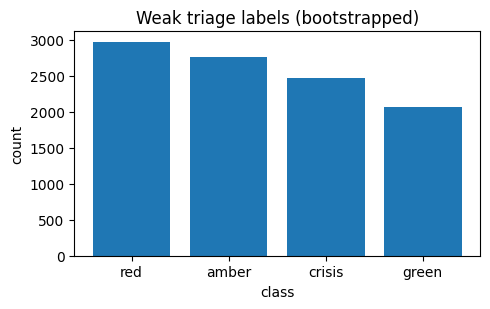

In [67]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# Expecting cleaned `df` with: Title, Text, Top_10_Comments, unified_text, created_dt, etc.

# 1) Minimal context fields (Malmasi-style: include thread context; here we use top comments)
df["post_only_text"] = (df["Title"].astype(str) + " " + df["Text"].astype(str)).str.lower()
df["context_text"]   = (df["post_only_text"] + " " + df["Top_10_Comments"].astype(str)).str.lower()

# 2) Keyword sets (very small, interpretable, adjustable)
kw_crisis = [
    "suicide", "kill myself", "end my life", "want to die", "self harm", "self-harm",
    "overdose", "can't go on", "i'm done", "ending it", "hurt myself", "hang myself"
]
kw_red = [
    "hopeless", "no way out", "worthless", "can't cope", "severe", "cutting", "relapse",
    "panic attack", "shaking", "numb", "empty all the time", "voice telling me", "visions"
]
kw_amber = [
    "anxious", "anxiety", "depressed", "depression", "overwhelmed", "crying",
    "can't sleep", "insomnia", "very stressed", "please help", "need help", "advice please"
]

# 3) Vectorized regex flags on the CONTEXT text (post + comments)
text = df["context_text"]

pat_crisis = re.compile("|".join([re.escape(k) for k in kw_crisis]))
pat_red    = re.compile("|".join([re.escape(k) for k in kw_red]))
pat_amber  = re.compile("|".join([re.escape(k) for k in kw_amber]))

has_crisis = text.str.contains(pat_crisis, na=False)
has_red    = text.str.contains(pat_red,    na=False)
has_amber  = text.str.contains(pat_amber,  na=False)

# 4) Assign severity with simple precedence: crisis > red > amber > green
triage = np.where(has_crisis, "crisis",
          np.where(has_red,    "red",
          np.where(has_amber,  "amber", "green")))

df["triage_weak"] = triage

print("— Weak triage label distribution —")
display(df["triage_weak"].value_counts().rename_axis("triage_weak").to_frame("count"))

# quick bar
vc = df["triage_weak"].value_counts()
plt.figure(figsize=(5,3.2))
plt.bar(vc.index, vc.values)
plt.title("Weak triage labels (bootstrapped)")
plt.xlabel("class"); plt.ylabel("count")
plt.tight_layout(); plt.show()


In [68]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

RANDOM_STATE = 42

y_labels = df["triage_weak"].astype(str).values

# Variant A: post-only; Variant B: post + comments (context)
X_post     = df["post_only_text"].astype(str).values
X_context  = df["context_text"].astype(str).values

Xa_tr, Xa_te, ya_tr, ya_te = train_test_split(
    X_post, y_labels, test_size=0.2, random_state=RANDOM_STATE, stratify=y_labels
)
Xb_tr, Xb_te, yb_tr, yb_te = train_test_split(
    X_context, y_labels, test_size=0.2, random_state=RANDOM_STATE, stratify=y_labels
)

vecA = TfidfVectorizer(ngram_range=(1,2), min_df=3, max_features=150_000)
vecB = TfidfVectorizer(ngram_range=(1,2), min_df=3, max_features=150_000)

XAtr = vecA.fit_transform(Aa := Xa_tr)  # keep code compact
XAte = vecA.transform(Xa_te)

XPtr = vecB.fit_transform(Bb := Xb_tr)
XPte = vecB.transform(Xb_te)

XAtr.shape, XPtr.shape


((8204, 63997), (8204, 150000))

=== POST-ONLY (no context) — Logistic Regression ===
              precision    recall  f1-score   support

       amber      0.514     0.479     0.496       553
      crisis      0.639     0.695     0.666       492
       green      0.446     0.564     0.498       413
         red      0.672     0.540     0.599       594

    accuracy                          0.566      2052
   macro avg      0.567     0.570     0.565      2052
weighted avg      0.576     0.566     0.567      2052



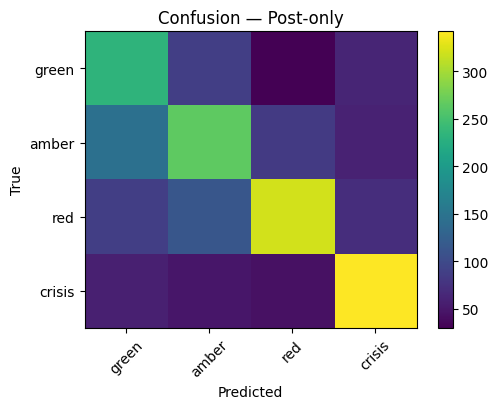

=== POST + COMMENTS (context) — Logistic Regression ===
              precision    recall  f1-score   support

       amber      0.630     0.635     0.632       553
      crisis      0.794     0.774     0.784       492
       green      0.571     0.707     0.632       413
         red      0.766     0.650     0.703       594

    accuracy                          0.687      2052
   macro avg      0.690     0.691     0.688      2052
weighted avg      0.697     0.687     0.689      2052



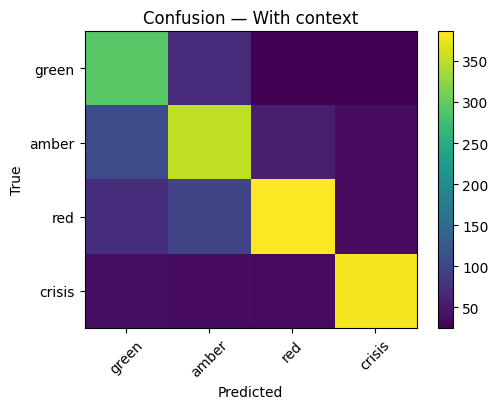

In [69]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# class weights: balance the 4-way triage
classes = np.unique(ya_tr)
cw = "balanced"  # simple and effective for prototypes

logreg_A = LogisticRegression(
    solver="saga", multi_class="multinomial", penalty="l2",
    class_weight=cw, max_iter=3000, n_jobs=1, verbose=0
)
logreg_B = LogisticRegression(
    solver="saga", multi_class="multinomial", penalty="l2",
    class_weight=cw, max_iter=3000, n_jobs=1, verbose=0
)

logreg_A.fit(XAtr, ya_tr)
logreg_B.fit(XPtr, yb_tr)

ya_pred = logreg_A.predict(XAte)
yb_pred = logreg_B.predict(XPte)

print("=== POST-ONLY (no context) — Logistic Regression ===")
print(classification_report(ya_te, ya_pred, digits=3))

cmA = confusion_matrix(ya_te, ya_pred, labels=["green","amber","red","crisis"])
plt.figure(figsize=(5.2,4.2))
plt.imshow(cmA, aspect="auto")
plt.title("Confusion — Post-only")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.xticks([0,1,2,3], ["green","amber","red","crisis"], rotation=45)
plt.yticks([0,1,2,3], ["green","amber","red","crisis"])
plt.colorbar(); plt.tight_layout(); plt.show()

print("=== POST + COMMENTS (context) — Logistic Regression ===")
print(classification_report(yb_te, yb_pred, digits=3))

cmB = confusion_matrix(yb_te, yb_pred, labels=["green","amber","red","crisis"])
plt.figure(figsize=(5.2,4.2))
plt.imshow(cmB, aspect="auto")
plt.title("Confusion — With context")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.xticks([0,1,2,3], ["green","amber","red","crisis"], rotation=45)
plt.yticks([0,1,2,3], ["green","amber","red","crisis"])
plt.colorbar(); plt.tight_layout(); plt.show()


In [70]:
def predict_triage(title="", text="", comments="", use_context=True, topk=4):
    s_post = (str(title) + " " + str(text)).strip()
    s_full = (s_post + " " + str(comments)).strip()
    if use_context:
        Xv = vecB.transform([s_full.lower()])
        probs = logreg_B.predict_proba(Xv)[0]
        labs  = logreg_B.classes_
    else:
        Xv = vecA.transform([s_post.lower()])
        probs = logreg_A.predict_proba(Xv)[0]
        labs  = logreg_A.classes_
    idx = np.argsort(probs)[::-1][:topk]
    return pd.DataFrame({"class": labs[idx], "probability": probs[idx]})

# demo
predict_triage(
    title="I can't sleep and I'm shaking",
    text="It feels like a panic attack and I can't cope tonight.",
    comments="please reach out to someone you trust | try slow breathing"
)


,class,probability
0,red,0.758407
1,green,0.149330
2,crisis,0.047873
3,amber,0.044390


## 2

In [74]:
import os, re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from IPython.display import display

# If you have NRC VAD and/or Mohammad emotion CSVs locally, set paths here:
VAD_CSV = "/kaggle/working/NRC-VAD-Lexicon.csv"             # columns: word,valence,arousal,dominance
EMO_CSV = "/kaggle/working/NRC-Emotion-Intensity.csv"       # columns: word,anger,fear,joy,sadness

# Fallback: tiny seed lexicons (just to show method)
VAD_SEED = {
    "anxiety": (0.30, 0.80, 0.40), "anxious": (0.32, 0.82, 0.38), "panic": (0.20, 0.90, 0.30),
    "depressed": (0.15, 0.35, 0.25), "sad": (0.20, 0.30, 0.30), "hopeless": (0.10, 0.25, 0.20),
    "calm": (0.70, 0.20, 0.65), "relief": (0.75, 0.30, 0.60), "happy": (0.85, 0.55, 0.70),
    "suicide": (0.05, 0.75, 0.20), "help": (0.65, 0.45, 0.55), "support": (0.70, 0.40, 0.60)
}
EMO_SEED = {
    "anger": {"angry":0.9,"furious":1.0,"rage":0.95,"annoyed":0.6},
    "fear": {"afraid":0.9,"fear":0.85,"scared":0.9,"panic":1.0,"anxious":0.8},
    "joy": {"happy":0.9,"relief":0.7,"glad":0.8,"grateful":0.8,"calm":0.6},
    "sadness": {"sad":0.9,"depressed":1.0,"hopeless":0.95,"lonely":0.8}
}

# Load real lexicons if present (no try/except, just if/else)
if os.path.exists(VAD_CSV):
    vad_df = pd.read_csv(VAD_CSV)
    vad_df.columns = [c.lower() for c in vad_df.columns]
    VAD_MAP = dict(zip(vad_df["word"].astype(str), zip(vad_df["valence"], vad_df["arousal"], vad_df.get("dominance", pd.Series([np.nan]*len(vad_df))))))
else:
    VAD_MAP = VAD_SEED

if os.path.exists(EMO_CSV):
    emo_df = pd.read_csv(EMO_CSV)
    emo_df.columns = [c.lower() for c in emo_df.columns]
    EMO_MAP = {
        "anger":   dict(zip(emo_df["word"].astype(str), emo_df.get("anger",   pd.Series([0]*len(emo_df))).astype(float))),
        "fear":    dict(zip(emo_df["word"].astype(str), emo_df.get("fear",    pd.Series([0]*len(emo_df))).astype(float))),
        "joy":     dict(zip(emo_df["word"].astype(str), emo_df.get("joy",     pd.Series([0]*len(emo_df))).astype(float))),
        "sadness": dict(zip(emo_df["word"].astype(str), emo_df.get("sadness", pd.Series([0]*len(emo_df))).astype(float))),
    }
else:
    EMO_MAP = EMO_SEED

token_pat = re.compile(r"[a-z']{2,}")

def row_scores(text):
    toks = token_pat.findall(str(text).lower())
    n = len(toks)
    # VAD
    vals = []; aros = []; doms = []
    for w in toks:
        if w in VAD_MAP:
            v,a,d = VAD_MAP[w]
            vals.append(float(v)); aros.append(float(a)); doms.append(float(d) if d==d else np.nan)
    val_mean = float(np.mean(vals)) if len(vals)>0 else np.nan
    aro_mean = float(np.mean(aros)) if len(aros)>0 else np.nan
    dom_mean = float(np.nanmean(doms)) if len(doms)>0 else np.nan
    cov = len(vals)/max(n,1)

    # Emotions
    def emo_mean(emap):
        sc = []
        for w in toks:
            if w in emap: sc.append(float(emap[w]))
        return float(np.mean(sc)) if len(sc)>0 else np.nan

    anger   = emo_mean(EMO_MAP["anger"])
    fear    = emo_mean(EMO_MAP["fear"])
    joy     = emo_mean(EMO_MAP["joy"])
    sadness = emo_mean(EMO_MAP["sadness"])
    return pd.Series([val_mean, aro_mean, dom_mean, cov, anger, fear, joy, sadness])

scores = df["unified_text"].apply(row_scores)
scores.columns = ["vad_val","vad_aro","vad_dom","affect_coverage","emo_anger","emo_fear","emo_joy","emo_sadness"]
df_affect = pd.concat([df.reset_index(drop=True), scores.reset_index(drop=True)], axis=1)

display(df_affect[["unified_text","vad_val","vad_aro","emo_anger","emo_fear","emo_joy","emo_sadness","affect_coverage"]].head(5))


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,unified_text,vad_val,vad_aro,emo_anger,emo_fear,emo_joy,emo_sadness,affect_coverage
0,My son's ADHD saved his sister's life My son w...,0.525,0.425,NaN,NaN,0.85,0.9,0.001942
1,Reminder: If you made it to adulthood with lat...,0.550,0.550,NaN,NaN,0.80,NaN,0.003759
2,Children with higher IQ scores were diagnosed ...,0.500,0.400,NaN,NaN,NaN,1.0,0.002849
3,LIFE HACK I JUST DISCOVERED I feel like I just...,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
4,no meds 10 months. i'm barely recognizable 10 ...,0.560,0.420,0.9,0.9,NaN,0.9,0.006353


<Figure size 600x400 with 0 Axes>

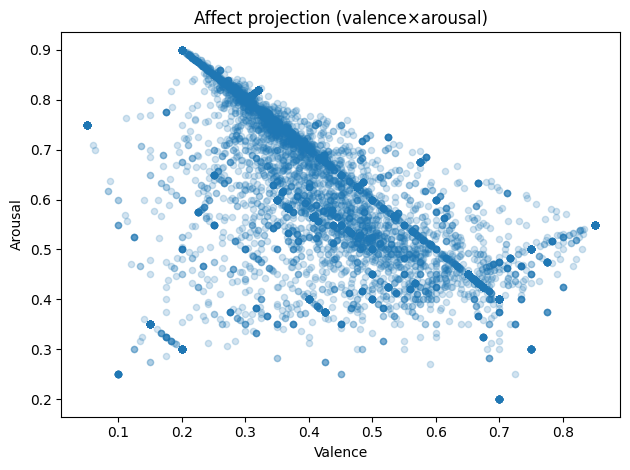

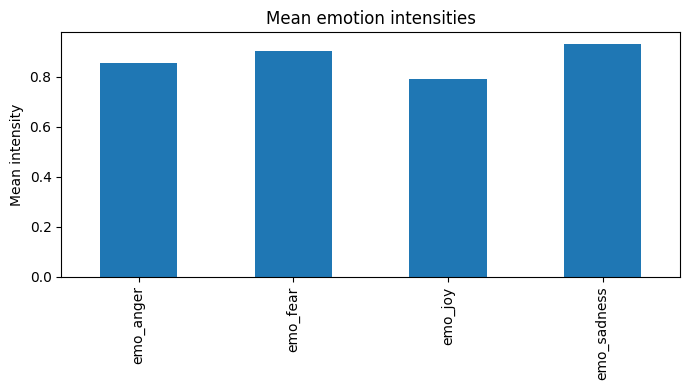

In [75]:
plt.figure(figsize=(6,4))
df_affect[["vad_val","vad_aro"]].dropna().plot(kind="scatter", x="vad_val", y="vad_aro", alpha=0.2)
plt.title("Affect projection (valence×arousal)"); plt.xlabel("Valence"); plt.ylabel("Arousal")
plt.tight_layout(); plt.show()

emo_cols = ["emo_anger","emo_fear","emo_joy","emo_sadness"]
plt.figure(figsize=(7,4))
df_affect[emo_cols].mean().plot(kind="bar")
plt.title("Mean emotion intensities"); plt.ylabel("Mean intensity")
plt.tight_layout(); plt.show()


## 3

,unified_text,ratio_1p,ratio_we,ratio_neg,ttr
0,My son's ADHD saved his sister's life My son w...,0.044199,0.004604,0.008287,0.442910
1,Reminder: If you made it to adulthood with lat...,0.065068,0.006849,0.011416,0.447489
2,Children with higher IQ scores were diagnosed ...,0.062226,0.005259,0.014023,0.411043
3,LIFE HACK I JUST DISCOVERED I feel like I just...,0.071542,0.009539,0.007949,0.492846
4,no meds 10 months. i'm barely recognizable 10 ...,0.063011,0.005834,0.015169,0.444574


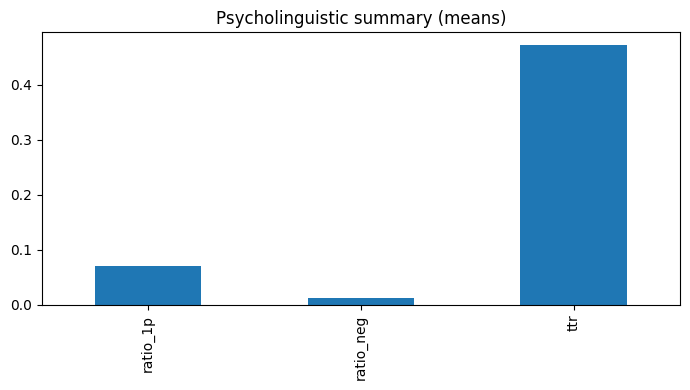

In [76]:
import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from IPython.display import display

text_series = df_affect["unified_text"].astype(str).str.lower()

fps = {"i","me","my","mine"}
sps = {"we","us","our","ours"}
negations = {"no","not","never","nothing","nowhere","neither","n't"}

def feats(s):
    t = re.findall(r"[a-z']+", s)
    ntok = len(t)
    if ntok == 0: ntok = 1
    n1p = sum(w in fps for w in t)/ntok
    n1p_pl = sum(w in sps for w in t)/ntok
    qmarks = s.count("?")
    excls = s.count("!")
    urls = len(re.findall(r"http[s]?://\S+", s))
    caps = len(re.findall(r"\b[A-Z]{2,}\b", df_affect["unified_text"])) if False else 0
    neg = sum(w in negations for w in t)/ntok
    avg_tok_len = np.mean([len(w) for w in t])
    type_token = len(set(t))/max(len(t),1)
    return pd.Series([n1p, n1p_pl, qmarks, excls, urls, neg, avg_tok_len, type_token])

feat_df = text_series.apply(feats)
feat_df.columns = ["ratio_1p","ratio_we","qmarks","excls","urls","ratio_neg","avg_tok_len","ttr"]
df_psy = pd.concat([df_affect.reset_index(drop=True), feat_df.reset_index(drop=True)], axis=1)
display(df_psy[["unified_text","ratio_1p","ratio_we","ratio_neg","ttr"]].head(5))

plt.figure(figsize=(7,4))
df_psy[["ratio_1p","ratio_neg","ttr"]].mean().plot(kind="bar")
plt.title("Psycholinguistic summary (means)"); plt.tight_layout(); plt.show()


## 4

/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less
  return op(a, b)
/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)


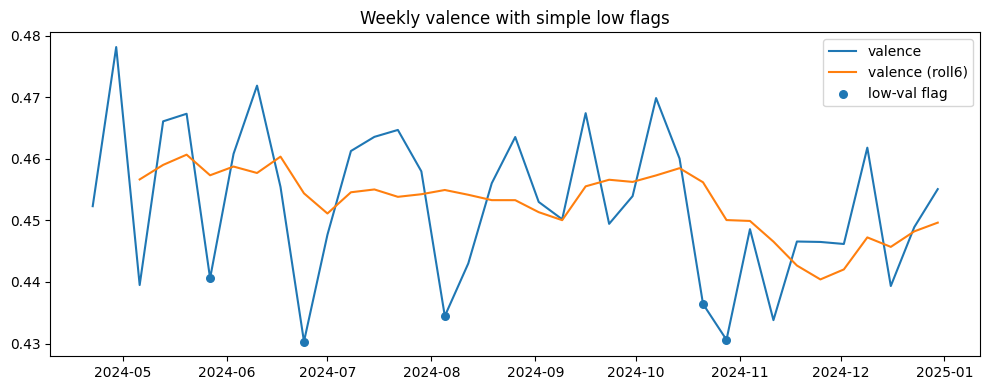

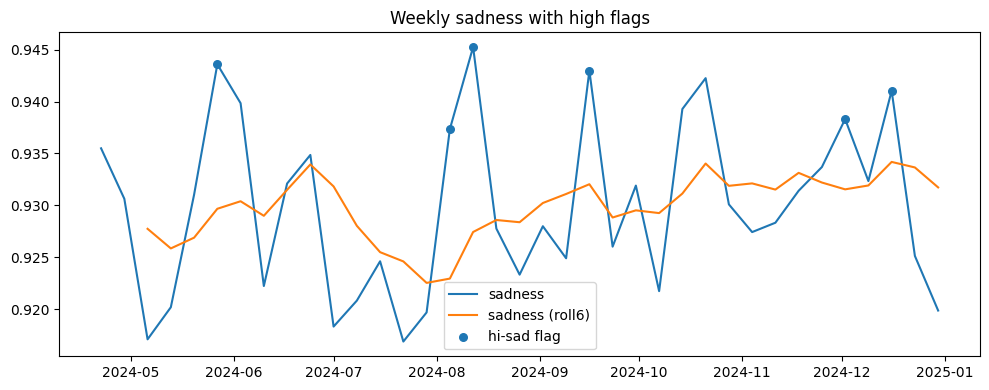

,low_valence_flag,high_sadness_flag
week,,
2024-10-28,1,0
2024-11-04,0,0
2024-11-11,0,0
2024-11-18,0,0
2024-11-25,0,0
2024-12-02,0,1
2024-12-09,0,0
2024-12-16,0,1
2024-12-23,0,0


In [77]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt

df_time = df_psy[df_psy["created_dt"].notna()].copy()
df_time["week"] = df_time["created_dt"].dt.to_period("W").dt.start_time

wk = df_time.groupby("week")[["vad_val","vad_aro","emo_anger","emo_fear","emo_joy","emo_sadness"]].mean().sort_index()

# Simple anomaly flags: valence below rolling mean - 1*std, sadness above rolling mean + 1*std
roll = wk.rolling(6, min_periods=3).mean()
std  = wk.rolling(6, min_periods=3).std()

flag_low_val = (wk["vad_val"] < (roll["vad_val"] - std["vad_val"])).astype(int)
flag_hi_sad  = (wk["emo_sadness"] > (roll["emo_sadness"] + std["emo_sadness"])).astype(int)

plt.figure(figsize=(10,4))
plt.plot(wk.index, wk["vad_val"], label="valence")
plt.plot(roll.index, roll["vad_val"], label="valence (roll6)")
plt.scatter(wk.index[flag_low_val==1], wk["vad_val"][flag_low_val==1], label="low-val flag", s=30)
plt.title("Weekly valence with simple low flags"); plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(10,4))
plt.plot(wk.index, wk["emo_sadness"], label="sadness")
plt.plot(roll.index, roll["emo_sadness"], label="sadness (roll6)")
plt.scatter(wk.index[flag_hi_sad==1], wk["emo_sadness"][flag_hi_sad==1], label="hi-sad flag", s=30)
plt.title("Weekly sadness with high flags"); plt.legend(); plt.tight_layout(); plt.show()

wk_flags = pd.DataFrame({"low_valence_flag":flag_low_val, "high_sadness_flag":flag_hi_sad})
display(wk_flags.tail(10))
